# Topic

The topic choose here is the wine quality. We are using two datasets  using red and white wine samples.
 The inputs include objective tests (e.g. PH values) and the output is based on sensory data (median of at least 3 evaluations made by wine experts). 

Each expert graded the wine quality between 0 (very bad) and 10 (very excellent).

# Objectif

In this project we will try to identify, via the linear regression method, if it is possible to determine the quality of the wine (our target) among the features of the dataset

# Import librairies

In [220]:
import pandas as pd
from pandas_visual_analysis import VisualAnalysis
import seaborn as sns
from visualizer import Visualizer

import matplotlib.pyplot as plt
import seaborn as sns

# read files and concatenate

In [221]:
#dataset red wine and white wine
url1='/Users/tatiana/WineQuality/data/winequality-red.csv'
url2='/Users/tatiana/WineQuality/data/winequality-white.csv'

In [222]:
#read the csv files
df1=pd.read_csv(url1)
df2=pd.read_csv(url2)

In [223]:
#look at the dataframe
df1

,"fixed acidity;""volatile acidity"";""citric acid"";""residual sugar"";""chlorides"";""free sulfur dioxide"";""total sulfur dioxide"";""density"";""pH"";""sulphates"";""alcohol"";""quality"""
0,7.4;0.7;0;1.9;0.076;11;34;0.9978;3.51;0.56;9.4;5
1,7.8;0.88;0;2.6;0.098;25;67;0.9968;3.2;0.68;9.8;5
2,7.8;0.76;0.04;2.3;0.092;15;54;0.997;3.26;0.65;...
3,11.2;0.28;0.56;1.9;0.075;17;60;0.998;3.16;0.58...
4,7.4;0.7;0;1.9;0.076;11;34;0.9978;3.51;0.56;9.4;5
...,...
1594,6.2;0.6;0.08;2;0.09;32;44;0.9949;3.45;0.58;10.5;5
1595,5.9;0.55;0.1;2.2;0.062;39;51;0.99512;3.52;0.76...
1596,6.3;0.51;0.13;2.3;0.076;29;40;0.99574;3.42;0.7...
1597,5.9;0.645;0.12;2;0.075;32;44;0.99547;3.57;0.71...


In [224]:
df2

,"fixed acidity;""volatile acidity"";""citric acid"";""residual sugar"";""chlorides"";""free sulfur dioxide"";""total sulfur dioxide"";""density"";""pH"";""sulphates"";""alcohol"";""quality"""
0,7;0.27;0.36;20.7;0.045;45;170;1.001;3;0.45;8.8;6
1,6.3;0.3;0.34;1.6;0.049;14;132;0.994;3.3;0.49;9...
2,8.1;0.28;0.4;6.9;0.05;30;97;0.9951;3.26;0.44;1...
3,7.2;0.23;0.32;8.5;0.058;47;186;0.9956;3.19;0.4...
4,7.2;0.23;0.32;8.5;0.058;47;186;0.9956;3.19;0.4...
...,...
4893,6.2;0.21;0.29;1.6;0.039;24;92;0.99114;3.27;0.5...
4894,6.6;0.32;0.36;8;0.047;57;168;0.9949;3.15;0.46;...
4895,6.5;0.24;0.19;1.2;0.041;30;111;0.99254;2.99;0....
4896,5.5;0.29;0.3;1.1;0.022;20;110;0.98869;3.34;0.3...


In [225]:
df1.columns

Index(['fixed acidity;"volatile acidity";"citric acid";"residual sugar";"chlorides";"free sulfur dioxide";"total sulfur dioxide";"density";"pH";"sulphates";"alcohol";"quality"'], dtype='object')

In [226]:
df2.columns

Index(['fixed acidity;"volatile acidity";"citric acid";"residual sugar";"chlorides";"free sulfur dioxide";"total sulfur dioxide";"density";"pH";"sulphates";"alcohol";"quality"'], dtype='object')

All the data are located in the column :
    split all after ";"
In the column names :
    1.replace le space by a "_"
    2.delete "" for some of them

# Concatenate files

In [227]:
df_wines=df1.append(df2)

In [228]:
df_wines

,"fixed acidity;""volatile acidity"";""citric acid"";""residual sugar"";""chlorides"";""free sulfur dioxide"";""total sulfur dioxide"";""density"";""pH"";""sulphates"";""alcohol"";""quality"""
0,7.4;0.7;0;1.9;0.076;11;34;0.9978;3.51;0.56;9.4;5
1,7.8;0.88;0;2.6;0.098;25;67;0.9968;3.2;0.68;9.8;5
2,7.8;0.76;0.04;2.3;0.092;15;54;0.997;3.26;0.65;...
3,11.2;0.28;0.56;1.9;0.075;17;60;0.998;3.16;0.58...
4,7.4;0.7;0;1.9;0.076;11;34;0.9978;3.51;0.56;9.4;5
...,...
4893,6.2;0.21;0.29;1.6;0.039;24;92;0.99114;3.27;0.5...
4894,6.6;0.32;0.36;8;0.047;57;168;0.9949;3.15;0.46;...
4895,6.5;0.24;0.19;1.2;0.041;30;111;0.99254;2.99;0....
4896,5.5;0.29;0.3;1.1;0.022;20;110;0.98869;3.34;0.3...


In [229]:
df_rows = df1.shape[0]+df2.shape[0]
df_wines_rows = df_wines.shape[0]

if df_rows == df_wines_rows :
    print('Good! the number of rows expected and the number of the new dataframe are the same')
else:
    print('Grrr, pb of number of rows!')
print(f'After having concontenate both dataframes, number of rows is {df_wines_rows} and\na sum of rows of both dataframe is {df_rows}')

Good! the number of rows expected and the number of the new dataframe are the same
After having concontenate both dataframes, number of rows is 6497 and
a sum of rows of both dataframe is 6497


# Manipulation

Now, split (;) all the dataframe

In [230]:
#split the dataframe into columns.
df_wine = df_wines.iloc[:,0].str.split(';', expand=True)

In [231]:
df_wine

,0,1,2,3,4,5,6,7,8,9,10,11
0,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6
4,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24,92,0.99114,3.27,0.5,11.2,6
4894,6.6,0.32,0.36,8,0.047,57,168,0.9949,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30,111,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.3,1.1,0.022,20,110,0.98869,3.34,0.38,12.8,7


Columns has been created : OK. We need names for the columns. We will use those from our original dataframe

In [232]:
#give the names of the columns of the df_wine thanks to the original dataframe
df_wine.columns = df1.columns[0].split(';')

In [233]:
df_wine.head()

,fixed acidity,"""volatile acidity""","""citric acid""","""residual sugar""","""chlorides""","""free sulfur dioxide""","""total sulfur dioxide""","""density""","""pH""","""sulphates""","""alcohol""","""quality"""
0,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6
4,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5


# Add a column in the dataframe - color of the wine : red or white

In [234]:
#add new column in the 1st position : color with 2 unique values, red or white
df_wine.insert(0, "color", "Red") 

In [235]:
df_wine.columns

Index(['color', 'fixed acidity', '"volatile acidity"', '"citric acid"',
       '"residual sugar"', '"chlorides"', '"free sulfur dioxide"',
       '"total sulfur dioxide"', '"density"', '"pH"', '"sulphates"',
       '"alcohol"', '"quality"'],
      dtype='object')

The column color has been added in the 1rst place and fill with red value, with success.
Now we will replace red by white in the column color for the white win of the dataframe

In [236]:
last_row_red = df1.shape[0]#last row in the dataframe of red wine
first_row_white=last_row_red+1#last row in the dataframe of red wine

df_wine.loc[last_row_red:,'color'] = "white"#replace white by red in the dataframe wine
df_wine

,color,fixed acidity,"""volatile acidity""","""citric acid""","""residual sugar""","""chlorides""","""free sulfur dioxide""","""total sulfur dioxide""","""density""","""pH""","""sulphates""","""alcohol""","""quality"""
0,Red,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
1,Red,7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5
2,Red,7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5
3,Red,11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6
4,Red,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,white,6.2,0.21,0.29,1.6,0.039,24,92,0.99114,3.27,0.5,11.2,6
4894,white,6.6,0.32,0.36,8,0.047,57,168,0.9949,3.15,0.46,9.6,5
4895,white,6.5,0.24,0.19,1.2,0.041,30,111,0.99254,2.99,0.46,9.4,6
4896,white,5.5,0.29,0.3,1.1,0.022,20,110,0.98869,3.34,0.38,12.8,7


# Cleanning

## Columns

In [237]:
#replace spaces in the names'columns by _
df_wine.columns = df_wine.columns.str.replace(' ', '_')

In [238]:
df_wine

,color,fixed_acidity,"""volatile_acidity""","""citric_acid""","""residual_sugar""","""chlorides""","""free_sulfur_dioxide""","""total_sulfur_dioxide""","""density""","""pH""","""sulphates""","""alcohol""","""quality"""
0,Red,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
1,Red,7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5
2,Red,7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5
3,Red,11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6
4,Red,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,white,6.2,0.21,0.29,1.6,0.039,24,92,0.99114,3.27,0.5,11.2,6
4894,white,6.6,0.32,0.36,8,0.047,57,168,0.9949,3.15,0.46,9.6,5
4895,white,6.5,0.24,0.19,1.2,0.041,30,111,0.99254,2.99,0.46,9.4,6
4896,white,5.5,0.29,0.3,1.1,0.022,20,110,0.98869,3.34,0.38,12.8,7


Spaces in the columns have been replaced by _ >> OK

In [239]:
#delete "" in the names'columns 
df_wine.columns = df_wine.columns.str.replace('"', '')

In [240]:
df_wine

,color,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,Red,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
1,Red,7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5
2,Red,7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5
3,Red,11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6
4,Red,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,white,6.2,0.21,0.29,1.6,0.039,24,92,0.99114,3.27,0.5,11.2,6
4894,white,6.6,0.32,0.36,8,0.047,57,168,0.9949,3.15,0.46,9.6,5
4895,white,6.5,0.24,0.19,1.2,0.041,30,111,0.99254,2.99,0.46,9.4,6
4896,white,5.5,0.29,0.3,1.1,0.022,20,110,0.98869,3.34,0.38,12.8,7


" in the columns have been deleted >> OK

# Dummies : categorical column color

In [241]:
pd.get_dummies(data=df_wine, columns=['color'], drop_first=True)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color_white
0,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6,0
4,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24,92,0.99114,3.27,0.5,11.2,6,1
4894,6.6,0.32,0.36,8,0.047,57,168,0.9949,3.15,0.46,9.6,5,1
4895,6.5,0.24,0.19,1.2,0.041,30,111,0.99254,2.99,0.46,9.4,6,1
4896,5.5,0.29,0.3,1.1,0.022,20,110,0.98869,3.34,0.38,12.8,7,1


In [242]:
dummy=pd.get_dummies(df_wine['color'], drop_first=True)#create dummies for the column color
dummy.head()

,white
0,0
1,0
2,0
3,0
4,0


Now the dummy dataframe has 1 for Red and 0 for white

In [243]:
df=pd.concat([df_wine,dummy],axis=1)#concat both dataframe by column
df.head()

,color,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,white
0,Red,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5,0
1,Red,7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5,0
2,Red,7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5,0
3,Red,11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6,0
4,Red,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5,0


Red and White columns with dummies has been created in the new data frame df

# drop the column color

In order to have a dataframe with only numerical values, the color column need to be dropped

In [244]:
df_reg=df.drop(columns =['color'])
df_reg.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,white
0,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0,2.6,0.098,25,67,0.9968,3.2,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15,54,0.997,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17,60,0.998,3.16,0.58,9.8,6,0
4,7.4,0.7,0,1.9,0.076,11,34,0.9978,3.51,0.56,9.4,5,0


## Missing values

In [245]:
na=df_reg.isna().sum()

In [246]:
na

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
white                   0
dtype: int64

The dataframe doen't have missing values >> Ok, let's continue

# Dataframe info

In [247]:
df_reg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6497 entries, 0 to 4897
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   fixed_acidity         6497 non-null   object
 1   volatile_acidity      6497 non-null   object
 2   citric_acid           6497 non-null   object
 3   residual_sugar        6497 non-null   object
 4   chlorides             6497 non-null   object
 5   free_sulfur_dioxide   6497 non-null   object
 6   total_sulfur_dioxide  6497 non-null   object
 7   density               6497 non-null   object
 8   pH                    6497 non-null   object
 9   sulphates             6497 non-null   object
 10  alcohol               6497 non-null   object
 11  quality               6497 non-null   object
 12  white                 6497 non-null   uint8 
dtypes: object(12), uint8(1)
memory usage: 826.2+ KB


The columns are "object", we need numerical for the statistical Analysis with Linear Regression.

Our original dataframe had 12 columns. Now, after manipulating, the dataframe df_reg has 14 columns (12:original + 1: color + 2:dummies - 1:color). The new number of columns is correct.

In [248]:
df_reg.describe(include='all')

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,white
count,6497,6497,6497,6497,6497,6497,6497,6497,6497,6497,6497,6497,6497.000000
unique,106,187,89,316,214,135,276,998,108,111,112,7,NaN
top,6.8,0.28,0.3,2,0.044,29,111,0.9976,3.16,0.5,9.5,6,NaN
freq,354,286,337,235,206,183,72,69,200,276,367,2836,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.507773
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.499978
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000


The describe of the dataframe for object and for uint8 give different information.
For our linear regression, we need only numerical datas.

## Convert all the object data into numerical data

In [249]:
col=df_reg.columns.tolist()

In [250]:
col

['fixed_acidity',
 'volatile_acidity',
 'citric_acid',
 'residual_sugar',
 'chlorides',
 'free_sulfur_dioxide',
 'total_sulfur_dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality',
 'white']

In [251]:
def to_numeric():
    #list of columns in the dataframe
    col=df_reg.columns.tolist()
    #loop in each column and convert all object into numerical
    for i in col:
        df_reg[i]=df_reg[i].astype(float)
        pass

In [252]:
to_numeric()

In [253]:
df_reg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6497 entries, 0 to 4897
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         6497 non-null   float64
 1   volatile_acidity      6497 non-null   float64
 2   citric_acid           6497 non-null   float64
 3   residual_sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free_sulfur_dioxide   6497 non-null   float64
 6   total_sulfur_dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   float64
 12  white                 6497 non-null   float64
dtypes: float64(13)
memory usage: 870.6 KB


Good! Dtype in the dataframe df_wine is now float64

In [254]:
df_reg.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,white
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,0.507773
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,0.499978
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,0.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,1.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,1.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000,1.000000


# Explorating Data Analysis

## correlation

In [255]:
#display your viz after running the code (matplot-jupyter)
%matplotlib inline 
sns.set()

import warnings
warnings.simplefilter('ignore')

%config InlineBackend.figure_format='svg'

#Test the multicollinearity
def heatmap_reg():
    #new dataframe HeatMap:
    df_reg_HeatMap = pd.DataFrame(df_reg, columns=df_reg.columns)

    #plot HeatMap with title and map param:
    plt.title("Heatmap - Wine correlation", fontsize =14,loc='center')
    heatmap_reg = sns.heatmap(df_reg.corr(), cmap="PiYG", robust=True,annot=True,annot_kws={'size':5},fmt=".1f",vmin=-1, vmax=1)
    square=True

    return heatmap_reg

<AxesSubplot:title={'center':'Heatmap - Wine correlation'}>

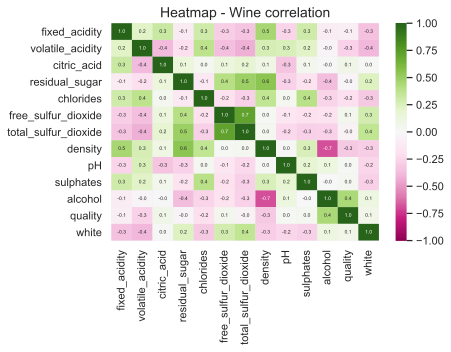

In [256]:
heatmap_reg()

In this heatmap, we don't see high correlation between the quality and other datas.
between quality and alcohol.
In descending order, the 3 strongest correlations with our target, the 'quality' of wine are :
    - alcohol          (0.4)
    - volatile acidity (-0.3)
    - density          (-0.3)
    
In descending order, we notice a strong correlation between that can be the sign of multicollinearity : 
    - red and white wine (-1)
    - alcohol and density (-0.7)
    - density and residual_sugar (-0.6)
    - density and fixed_acid (-0.5)
    - total_sulfure_dioxide and residual_sugar (-0.5)



## Viz

In [173]:
#pip install visualizer

### Visual Analysis

In [96]:
import pandas as pd
from pandas_visual_analysis import VisualAnalysis
import seaborn as sns
VisualAnalysis(df_reg)

# Linearity and normality test

In [107]:
#import seaborn as sns
#df_reg
#sns.set(style="ticks", color_codes=True)
#iris = sns.load_dataset(df_reg)
#g = sns.pairplot(df_reg)


#import matplotlib.pyplot as plt
#plt.show()

>> histogramme and scatterplot

AttributeError: 'DataFrame' object has no attribute 'shares_boxcox'

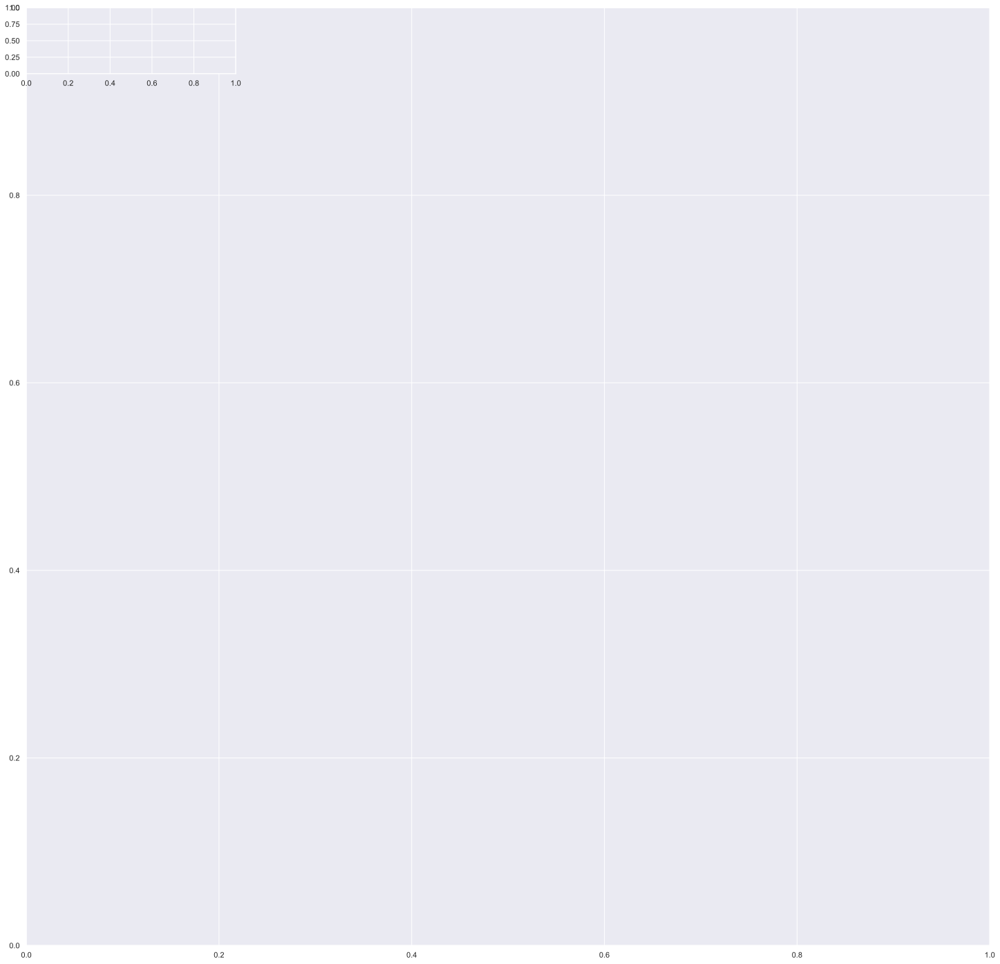

In [147]:
#fig, ax = plt.subplots(figsize = (25,25))
#for i, col in enumerate(df_reg.columns):
#    ax=fig.add_subplot(12, 4, i+1)
#    #df_numeric.iloc[:,i].hist(bins=100)
#    sns.scatterplot(df_reg.iloc[:,i], df_reg.shares_boxcox)
#    ax.set_title(col)
#plt.tight_layout()

# Modelling

Import librairies

In [257]:
from statsmodels.formula.api import ols
from statsmodels.api import OLS

In [258]:
df_reg.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,white
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0,0.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5.0,0.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5.0,0.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6.0,0.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0,0.0


In [259]:
ols('quality ~ alcohol+volatile_acidity+density', data=df_reg).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.267
Model:                            OLS   Adj. R-squared:                  0.267
Method:                 Least Squares   F-statistic:                     789.6
Date:                Fri, 02 Oct 2020   Prob (F-statistic):               0.00
Time:                        15:10:35   Log-Likelihood:                -7327.4
No. Observations:                6497   AIC:                         1.466e+04
Df Residuals:                    6493   BIC:                         1.469e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept          -35.1141      4.572     -7.679      0.000     -44.078     -26.151
alcohol              0.3825      0.011     34.935      0.000       0.361       0.404
volatile_acidity    -1.4909      0.060    -24.887      0.000      -1.608      -1.373
density             37.6250      4.522      8.321      0.000      28.761      46.489
==============================================================================
Omnibus:                      115.319   Durbin-Watson:                   1.653
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              235.492
Skew:                          -0.002   Prob(JB):                     7.30e-52
Kurtosis:                       3.933   Cond. No.                     7.39e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.39e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## without multicollinearity

We don't want multicollinearity so we try without density

In [260]:
#homoscedasticity (Var(Epsilon)=variance**2)
ols('quality ~ alcohol+volatile_acidity', data=df_reg).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.259
Model:                            OLS   Adj. R-squared:                  0.259
Method:                 Least Squares   F-statistic:                     1138.
Date:                Fri, 02 Oct 2020   Prob (F-statistic):               0.00
Time:                        15:10:38   Log-Likelihood:                -7361.9
No. Observations:                6497   AIC:                         1.473e+04
Df Residuals:                    6494   BIC:                         1.475e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            2.9266      0.086     34.218      0.000       2.759       3.094
alcohol              0.3184      0.008     40.701      0.000       0.303       0.334
volatile_acidity    -1.3225      0.057    -23.332      0.000      -1.434      -1.211
==============================================================================
Omnibus:                      113.368   Durbin-Watson:                   1.645
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              229.811
Skew:                           0.006   Prob(JB):                     1.25e-50
Kurtosis:                       3.921   Cond. No.                         100.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The message is correct, now. We don't have multicollinearity.

In [261]:
import matplotlib.pyplot as plt

TypeError: Cannot broadcast np.ndarray with operand of type <class 'builtin_function_or_method'>

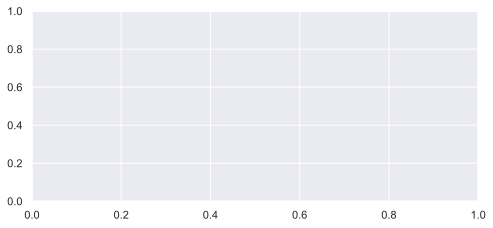

In [262]:
fig, ax=plt.subplots(figsize=(8,3.5))
reg=ols('quality ~ alcohol+volatile_acidity', data=df_reg).fit()
pred_val=reg.fittedvalues.copy()
true_val=df_reg['quality'].values.copy
resid=true_val-pred_val
res=sns.residplot(resid, pred_val)
plt.title('Homoscedastiscité')

In [264]:
from statsmodels.api import add_constant

In [265]:
y=df_reg.quality# our target
X=df_reg.drop('quality', axis=1)# our features

In [266]:
X.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'white'],
      dtype='object')

In [267]:
OLS(y, add_constant(X)).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.300
Model:                            OLS   Adj. R-squared:                  0.298
Method:                 Least Squares   F-statistic:                     231.1
Date:                Fri, 02 Oct 2020   Prob (F-statistic):               0.00
Time:                        15:11:29   Log-Likelihood:                -7181.2
No. Observations:                6497   AIC:                         1.439e+04
Df Residuals:                    6484   BIC:                         1.448e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   71.9305     11.992      5.998      0.000      48.422      95.439
fixed_acidity            0.0677      0.015      4.371      0.000       0.037       0.098
volatile_acidity        -1.4103      0.078    -18.171      0.000      -1.562      -1.258
citric_acid             -0.1806      0.080     -2.267      0.023      -0.337      -0.024
residual_sugar           0.0517      0.005      9.901      0.000       0.041       0.062
chlorides               -0.4812      0.331     -1.454      0.146      -1.130       0.168
free_sulfur_dioxide      0.0060      0.001      8.027      0.000       0.005       0.007
total_sulfur_dioxide    -0.0023      0.000     -8.434      0.000      -0.003      -0.002
density                -70.9067     12.227     -5.799      0.000     -94.876     -46.938
pH                       0.3800      0.090      4.213      0.000       0.203       0.557
sulphates                0.7812      0.076     10.314      0.000       0.633       0.930
alcohol                  0.2626      0.017     15.771      0.000       0.230       0.295
white                   -0.1864      0.022     -8.284      0.000      -0.230      -0.142
==============================================================================
Omnibus:                      153.384   Durbin-Watson:                   1.658
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              353.773
Skew:                          -0.032   Prob(JB):                     1.51e-77
Kurtosis:                       4.141   Cond. No.                     2.52e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.52e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Here we see a strong multicollinearity. We will drop some column in order to erase the multicollinearity.

# P Haking

In [268]:
def foo(col, X, y=y):
    if col:
        X1=X.drop(col, axis=1).copy()
    else:
        X1=X
    display(OLS(y,add_constant(X1)).fit().summary())
    return X1

In [269]:
#we drop chlorides column because of the pvalue
foo('chlorides', X, y=y)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.299
Model:                            OLS   Adj. R-squared:                  0.298
Method:                 Least Squares   F-statistic:                     251.8
Date:                Fri, 02 Oct 2020   Prob (F-statistic):               0.00
Time:                        15:11:33   Log-Likelihood:                -7182.3
No. Observations:                6497   AIC:                         1.439e+04
Df Residuals:                    6485   BIC:                         1.447e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   75.3720     11.757      6.411      0.000      52.324      98.420
fixed_acidity            0.0715      0.015      4.681      0.000       0.042       0.101
volatile_acidity        -1.4317      0.076    -18.784      0.000      -1.581      -1.282
citric_acid             -0.1985      0.079     -2.522      0.012      -0.353      -0.044
residual_sugar           0.0534      0.005     10.478      0.000       0.043       0.063
free_sulfur_dioxide      0.0059      0.001      7.959      0.000       0.004       0.007
total_sulfur_dioxide    -0.0023      0.000     -8.321      0.000      -0.003      -0.002
density                -74.4886     11.977     -6.219      0.000     -97.968     -51.009
pH                       0.4040      0.089      4.556      0.000       0.230       0.578
sulphates                0.7601      0.074     10.224      0.000       0.614       0.906
alcohol                  0.2627      0.017     15.778      0.000       0.230       0.295
white                   -0.1864      0.022     -8.285      0.000      -0.231      -0.142
==============================================================================
Omnibus:                      153.425   Durbin-Watson:                   1.659
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              353.741
Skew:                          -0.033   Prob(JB):                     1.54e-77
Kurtosis:                       4.141   Cond. No.                     2.47e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.47e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,white
0,7.4,0.70,0.00,1.9,11.0,34.0,0.99780,3.51,0.56,9.4,0.0
1,7.8,0.88,0.00,2.6,25.0,67.0,0.99680,3.20,0.68,9.8,0.0
2,7.8,0.76,0.04,2.3,15.0,54.0,0.99700,3.26,0.65,9.8,0.0
3,11.2,0.28,0.56,1.9,17.0,60.0,0.99800,3.16,0.58,9.8,0.0
4,7.4,0.70,0.00,1.9,11.0,34.0,0.99780,3.51,0.56,9.4,0.0
...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,24.0,92.0,0.99114,3.27,0.50,11.2,1.0
4894,6.6,0.32,0.36,8.0,57.0,168.0,0.99490,3.15,0.46,9.6,1.0
4895,6.5,0.24,0.19,1.2,30.0,111.0,0.99254,2.99,0.46,9.4,1.0
4896,5.5,0.29,0.30,1.1,20.0,110.0,0.98869,3.34,0.38,12.8,1.0


In [270]:
foo('citric_acid', X, y=y)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.299
Model:                            OLS   Adj. R-squared:                  0.298
Method:                 Least Squares   F-statistic:                     251.5
Date:                Fri, 02 Oct 2020   Prob (F-statistic):               0.00
Time:                        15:11:34   Log-Likelihood:                -7183.8
No. Observations:                6497   AIC:                         1.439e+04
Df Residuals:                    6485   BIC:                         1.447e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   71.7465     11.996      5.981      0.000      48.231      95.262
fixed_acidity            0.0596      0.015      3.952      0.000       0.030       0.089
volatile_acidity        -1.3413      0.071    -18.784      0.000      -1.481      -1.201
residual_sugar           0.0512      0.005      9.812      0.000       0.041       0.061
chlorides               -0.5974      0.327     -1.826      0.068      -1.239       0.044
free_sulfur_dioxide      0.0060      0.001      8.088      0.000       0.005       0.008
total_sulfur_dioxide    -0.0024      0.000     -8.967      0.000      -0.003      -0.002
density                -70.7394     12.231     -5.784      0.000     -94.716     -46.763
pH                       0.3961      0.090      4.405      0.000       0.220       0.572
sulphates                0.7734      0.076     10.218      0.000       0.625       0.922
alcohol                  0.2592      0.017     15.626      0.000       0.227       0.292
white                   -0.1809      0.022     -8.085      0.000      -0.225      -0.137
==============================================================================
Omnibus:                      153.381   Durbin-Watson:                   1.656
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              354.354
Skew:                          -0.028   Prob(JB):                     1.13e-77
Kurtosis:                       4.143   Cond. No.                     2.52e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.52e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

,fixed_acidity,volatile_acidity,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,white
0,7.4,0.70,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0.0
1,7.8,0.88,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,0.0
2,7.8,0.76,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,0.0
3,11.2,0.28,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,0.0
4,7.4,0.70,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0.0
...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1.0
4894,6.6,0.32,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,1.0
4895,6.5,0.24,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,1.0
4896,5.5,0.29,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1.0


# Assumptions

## Class for testing the Assumptions

In [271]:
class Assumption_Tester_OLS:
    """
    X - Pandas DataFrame with numerical values. Independent Variable
    y - Series with numerical values. Dependent Variable
    
    Tests a linear regression on the model to see if assumptions are being met

    """
    
    from sklearn.linear_model import LinearRegression
    
    def __init__(self, X,y):
        from numpy import ndarray
        from pandas import concat
        from pandas.core.frame import DataFrame
        from pandas.core.series import Series

        if type(X) == ndarray:
            self.features = ['X'+str(feature+1) for feature in range(X.shape[1])]
        elif type(X) == DataFrame:
            self.features=X.columns.to_list()
        else:
            print('Expected numpy array or pandas dataframe as X')
            return
        if type(y) == ndarray:
            self.output = 'y'
        elif type(y) == DataFrame:
            self.output=y.columns[0]
        elif type(y) == Series:
            self.output=y.name
        else:
            print('Expected numpy array or pandas dataframe as X')
            return

        self.X = X.values if type(X)==DataFrame else X
        self.y=y.iloc[:,0].values if type(y)==DataFrame else y.values if type(y)==Series else y
        
        self.model='not built yet'
        self.r2=0
        self.results={'Satisfied':[],'Potentially':[],'Violated':[]}
    
    def fit_model(self):
        from sklearn.linear_model import LinearRegression
        
        print('Fitting linear regression')        
        
        #Multi-threading when needed
        if self.X.shape[0] > 100000:
            self.model = LinearRegression(n_jobs=-1)
        else:
            self.model = LinearRegression()
        self.model.fit(self.X, self.y)
        
        self.predictions = self.model.predict(self.X)
        self.resid = self.y - self.predictions
        
        
    def build_model(self):
        self.fit_model()
        
        # Returning linear regression R^2 and coefficients before performing diagnostics
        self.r2 = self.model.score(self.X, self.y)
        print()
        print('R^2:', self.r2, '\n')
        print('Coefficients')
        print('-------------------------------------')
        print('Intercept:', self.model.intercept_)
        for idx,feature in enumerate(self.model.coef_):
            print(f'{self.features[idx]}: {round(feature,2)}')

    def linearity(self):
        """
        Linearity: Assumes there is a linear relationship between the predictors and
                   the response variable. If not, either a polynomial term or another
                   algorithm should be used.
        """
        from pandas import concat
        from numpy import arange
        from pandas.core.frame import DataFrame
        from pandas.core.series import Series        
        import seaborn as sns
        sns.set()
        import matplotlib.pyplot as plt
        
        if type(self.model)==str:
            self.fit_model()
        
        print('\n=======================================================================================')
        print('Assumption 1: Linear Relationship between the Target and the Features')
        print('Checking with a scatter plot of actual vs. predicted. Predictions should follow the diagonal line.')
        
        # Plotting the actual vs predicted values
        sns.regplot(self.y,self.predictions, fit_reg=False)
        
        # Plotting the diagonal line
        line_coords = arange(min(self.y.min(),self.predictions.min()), max(self.y.max(),self.predictions.max()))
        plt.plot(line_coords, line_coords,  # X and y points
                 color='darkorange', linestyle='--')
        plt.title('Actual vs. Predicted')
        plt.show()
        print('If non-linearity is apparent, consider adding a polynomial term \n\t\tor using box-cox transformation to make X or y follow normal distribution')
        
        print('\n\n\nBuilding a correlation table')
        print('\n=======================================================================================')
        df=concat([DataFrame(self.X),Series(self.y)],axis=1)
        df.columns=self.features+[self.output]
        df_corr=df[df.nunique()[df.nunique()>2].index].corr()[self.output].drop(self.output)
        
        print(f'\nParameters that are most likely VIOLATE linearity assumption and their correlation with {self.output}')
        display(df_corr[abs(df_corr)<0.25])

        print(f'\nParameters that are most likely FOLLOW linearity assumption and their correlation with {self.output}')
        display(df_corr[abs(df_corr)>=0.25])
        
        
        if df_corr[abs(df_corr)<0.25].shape[0]==0:
            self.results['Satisfied'].append('Linearity')
        elif df_corr[abs(df_corr)>=0.25].shape[0]==0:
            self.results['Violated'].append('Linearity')
        else:
            self.results['Potentially'].append('Linearity')
        
    def multicollinearity(self):
        """
        Multicollinearity: Assumes that predictors are not correlated with each other. If there is
                           correlation among the predictors, then either remove prepdictors with high
                           Variance Inflation Factor (VIF) values or perform dimensionality reduction
                           This assumption being violated causes issues with interpretability of the 
                           coefficients and the standard errors of the coefficients.
        """
        from statsmodels.stats.outliers_influence import variance_inflation_factor as VIF
        import matplotlib.pyplot as plt
        import seaborn as sns
        from pandas.core.frame import DataFrame
        sns.set()
        
        if type(self.model)==str:
            self.fit_model()
            
        print('\n=======================================================================================')
        print('Assumption 2: Little to no multicollinearity among predictors')
        # Plotting the heatmap
        plt.figure(figsize = (10,8))
        sns.heatmap(DataFrame(self.X, columns=self.features).corr(), annot=len(self.features)<10, center=0, cmap=sns.diverging_palette(220, 20, as_cmap=True))
        plt.title('Correlation of Variables')
        plt.show()
        print('Variance Inflation Factors (VIF)')
        print('> 10: An indication that multicollinearity may be present')
        print('> 100: Certain multicollinearity among the variables')
        print('-------------------------------------')
        # Gathering the VIF for each variable
        vifs = {i:VIF(self.X, idx) for idx,i in enumerate(self.features)}
        vifs = dict(sorted(vifs.items(), key=lambda x: x[1], reverse=True))
        for key, vif in vifs.items():
            print(f'{key}: {vif}')
        # Gathering and printing total cases of possible or definite multicollinearity
        possible_multicollinearity = sum([1 for vif in vifs.values() if vif > 10])
        definite_multicollinearity = sum([1 for vif in vifs.values() if vif > 100])
        print()
        print(f'{possible_multicollinearity} cases of possible multicollinearity')
        print(f'{definite_multicollinearity} cases of definite multicollinearity')
        print()
        if definite_multicollinearity == 0:
            if possible_multicollinearity == 0:
                print('Assumption satisfied')
                self.results['Satisfied'].append('Multicollinearity')
            else:
                print('Assumption possibly satisfied')
                print()
                print('Coefficient interpretability may be problematic')
                print('Consider removing variables with a high Variance Inflation Factor (VIF)')
                self.results['Potentially'].append('Multicollinearity')

        else:
            print('Assumption not satisfied')
            print()
            print('Coefficient interpretability will be problematic')
            print('Consider removing variables with a high Variance Inflation Factor (VIF)')
            self.results['Violated'].append('Multicollinearity')
            

    
    def autocorrelation(self):
        """
        Autocorrelation: Assumes that there is no autocorrelation in the residuals. If there is
                         autocorrelation, then there is a pattern that is not explained due to
                         the current value being dependent on the previous value.
                         This may be resolved by adding a lag variable of either the dependent
                         variable or some of the predictors.
        """
        from statsmodels.stats.stattools import durbin_watson        
        
        if type(self.model)==str:
            self.fit_model()
        print('\n=======================================================================================')
        print('Assumption 3: No Autocorrelation')
        print('\nPerforming Durbin-Watson Test')
        print('Values of 1.5 < d < 2.5 generally show that there is no autocorrelation in the data')
        print('0 to 2< is positive autocorrelation')
        print('>2 to 4 is negative autocorrelation')
        print('-------------------------------------')
        durbinWatson = durbin_watson(self.resid)
        print('Durbin-Watson:', durbinWatson)
        if durbinWatson < 1.5:
            print('Signs of positive autocorrelation', '\n')
            print('Assumption not satisfied', '\n')
            self.results['Violated'].append('Autocorrelation')
        elif durbinWatson > 2.5:
            print('Signs of negative autocorrelation', '\n')
            print('Assumption not satisfied', '\n')
            self.results['Violated'].append('Autocorrelation')
        else:
            print('Little to no autocorrelation', '\n')
            print('Assumption satisfied')
            self.results['Satisfied'].append('Autocorrelation')
            

    def homoskedasticity(self,p_value_thresh=0.05):
        """
        Homoskedasticity: Assumes that the errors exhibit constant variance
        """
        
        from statsmodels.stats.diagnostic import het_breuschpagan
        
        import matplotlib.pyplot as plt
        import seaborn
        from numpy import repeat
        seaborn.set()
        
        if type(self.model)==str:
            self.fit_model()
            
        print('\n=======================================================================================')
        print('Assumption 4: Homoskedasticity of Error Terms')
        print('Residuals should have relative constant variance')
        # Plotting the residuals
        plt.subplots(figsize=(12, 6))
        ax = plt.subplot(111)  # To remove spines
        plt.scatter(x=range(self.X.shape[0]), y=self.resid, alpha=0.5)
        plt.plot(repeat(0, self.X.shape[0]), color='darkorange', linestyle='--')
        ax.spines['right'].set_visible(False)  # Removing the right spine
        ax.spines['top'].set_visible(False)  # Removing the top spine
        plt.title('Residuals')
        plt.show() 
        print('If heteroskedasticity is apparent, confidence intervals and predictions will be affected')        
        print('\nConsider removing outliers and preprocessing features - nonlinear transformation can help')
        
        lnames=['Lagrange Multiplier', 'pvalue for LM','F stats','pvalue for Fstats']
        display({lnames[idx]:het_breuschpagan(self.resid,self.X)[idx] for idx in range(4)})
        if het_breuschpagan(self.resid,self.X)[3] < p_value_thresh:
            print('Signs of positive autocorrelation', '\n')
            print('Assumption potentially not satisfied', '\n')
            self.results['Potentially'].append('Autocorrelation')
        else:
            print('Signs of negative autocorrelation', '\n')
            print('Assumption satisfied', '\n')
            self.results['Satisfied'].append('Autocorrelation')

       
        
    def normality_resid(self,p_value_thresh=0.05):
        """
        Normality: Assumes that the error terms are normally distributed. If they are not,
        nonlinear transformations of variables may solve this.
        This assumption being violated primarily causes issues with the confidence intervals
        """
        from statsmodels.stats.diagnostic import normal_ad
        from scipy.stats import probplot
        import pylab
        import matplotlib.pyplot as plt
        import seaborn as sns
        from numpy import quantile,logical_or
        sns.set()

        if type(self.model)==str:
            self.fit_model()
            
        print('\n=======================================================================================')
        print('Assumption 5: The error terms are kinda normally distributed')
        print()
        print('Using the Anderson-Darling test for normal distribution')
        # Performing the test on the residuals
        p_value = normal_ad(self.resid)[1]
        print('p-value from the test - below 0.05 generally means non-normal:', p_value)
        # Reporting the normality of the residuals
        if p_value < p_value_thresh:
            print('Residuals are not normally distributed')
        else:
            print('Residuals are normally distributed')
        # Plotting the residuals distribution
        plt.subplots(figsize=(12, 6))
        plt.title('Distribution of Residuals')
        sns.distplot(self.resid)
        plt.show()
        print()
        if p_value > p_value_thresh:
            print('Assumption satisfied')
            self.results['Satisfied'].append('Normality')
        else:
            print('Assumption not satisfied')
            self.results['Violated'].append('Normality')
            print()
            print('Confidence intervals will likely be affected')
            print('Try performing nonlinear transformations on variables')
    
    
        print('Building a probability plot')
        quantiles=probplot(self.resid, dist='norm', plot=pylab);
        plt.show()
        qqq=(quantiles[0][1]-quantiles[0][1].mean())/quantiles[0][1].std()-quantiles[0][0]
        q75=quantile(qqq,0.75)
        q25=quantile(qqq,0.25)

        outliers_share=(logical_or(qqq>q75+(q75-q25)*1.7, qqq<q25-(q75-q25)*1.7).sum()/qqq.shape[0]).round(3)
        if outliers_share<0.005:
            print('Assumption can be considered as satisfied.')
            self.results['Satisfied'].append('Sub-Normality')
        elif outliers_share<0.05:
            self.results['Potentially'].append('Sub-Normality')
            print(f'\nIn your dataset you quite fat tails. You have {outliers_share} potential outliers ({logical_or(qqq>q75+(q75-q25)*1.7, qqq<q25-(q75-q25)*1.7).sum()} rows)')
        else:
            print(f'\nIn fact outliers are super significant. Probably it is better to split your dataset into 2 different ones.')
            self.results['Violated'].append('Sub-Normality')


    def run_all(self):
        self.build_model()
        self.linearity()
        self.multicollinearity()
        self.autocorrelation()
        self.homoskedasticity()
        self.normality_resid()
        display(self.results)


## Assumptions tests

### first test of assumptions

In [208]:
y=df_reg.quality# our target
X=df_reg.drop('quality', axis=1)# our features

In [209]:
type(y)

pandas.core.series.Series

In [210]:
y.iloc[0]

5.0

In [211]:
type(y)

pandas.core.series.Series

In [212]:
X

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,white
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0.0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,0.0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,0.0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,0.0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,1.0
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,1.0
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,1.0
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,1.0


In [192]:
type(X)

pandas.core.frame.DataFrame

In [193]:
MyAssumption_Tester_OLS=Assumption_Tester_OLS(X=X,y=y)

Fitting linear regression

R^2: 0.2995507298974278 

Coefficients
-------------------------------------
Intercept: 71.93049323495086
fixed_acidity: 0.07
volatile_acidity: -1.41
citric_acid: -0.18
residual_sugar: 0.05
chlorides: -0.48
free_sulfur_dioxide: 0.01
total_sulfur_dioxide: -0.0
density: -70.91
pH: 0.38
sulphates: 0.78
alcohol: 0.26
white: -0.19

Assumption 1: Linear Relationship between the Target and the Features
Checking with a scatter plot of actual vs. predicted. Predictions should follow the diagonal line.


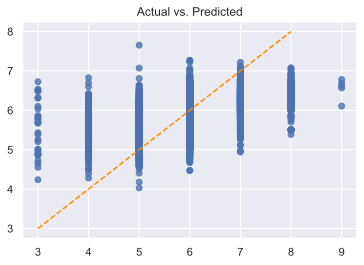

If non-linearity is apparent, consider adding a polynomial term 
		or using box-cox transformation to make X or y follow normal distribution



Building a correlation table


Parameters that are most likely VIOLATE linearity assumption and their correlation with quality


fixed_acidity          -0.076743
citric_acid             0.085532
residual_sugar         -0.036980
chlorides              -0.200666
free_sulfur_dioxide     0.055463
total_sulfur_dioxide   -0.041385
pH                      0.019506
sulphates               0.038485
Name: quality, dtype: float64


Parameters that are most likely FOLLOW linearity assumption and their correlation with quality


volatile_acidity   -0.265699
density            -0.305858
alcohol             0.444319
Name: quality, dtype: float64


Assumption 2: Little to no multicollinearity among predictors


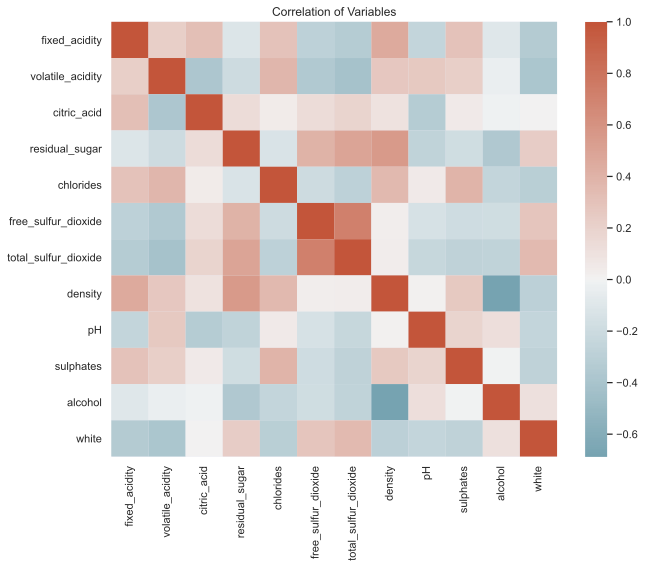

Variance Inflation Factors (VIF)
> 10: An indication that multicollinearity may be present
> 100: Certain multicollinearity among the variables
-------------------------------------
density: 989.4063159909559
pH: 623.6149498837062
alcohol: 111.32066109535609
fixed_acidity: 61.47650239927406
sulphates: 18.521448047151313
total_sulfur_dioxide: 14.876188687795297
citric_acid: 9.450183875478608
volatile_acidity: 9.296796790908639
free_sulfur_dioxide: 8.452447005911303
chlorides: 5.581246648700608
residual_sugar: 3.6099791100525036
white: 3.0376323577356

6 cases of possible multicollinearity
3 cases of definite multicollinearity

Assumption not satisfied

Coefficient interpretability will be problematic
Consider removing variables with a high Variance Inflation Factor (VIF)

Assumption 3: No Autocorrelation

Performing Durbin-Watson Test
Values of 1.5 < d < 2.5 generally show that there is no autocorrelation in the data
0 to 2< is positive autocorrelation
>2 to 4 is negative autocorrelatio

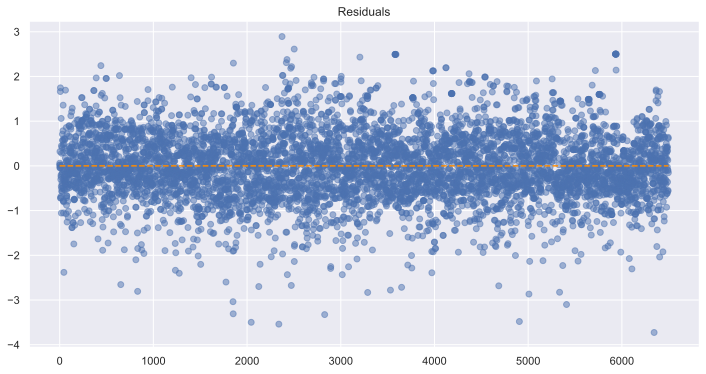

If heteroskedasticity is apparent, confidence intervals and predictions will be affected

Consider removing outliers and preprocessing features - nonlinear transformation can help


{'Lagrange Multiplier': 1639.7022930361925,
 'pvalue for LM': 0.0,
 'F stats': 182.431158431548,
 'pvalue for Fstats': 0.0}

Signs of positive autocorrelation 

Assumption potentially not satisfied 


Assumption 5: The error terms are kinda normally distributed

Using the Anderson-Darling test for normal distribution
p-value from the test - below 0.05 generally means non-normal: 1.1033412246089247e-27
Residuals are not normally distributed


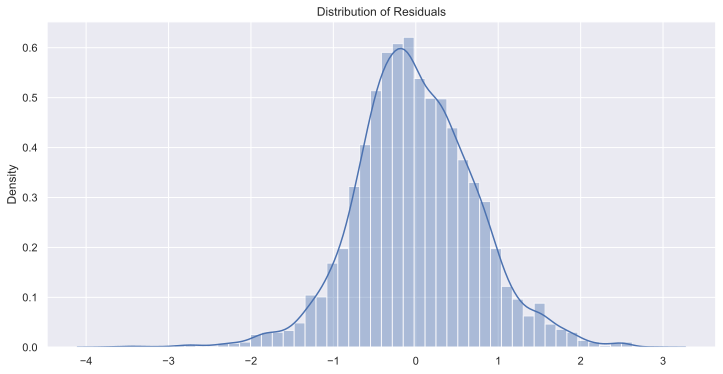


Assumption not satisfied

Confidence intervals will likely be affected
Try performing nonlinear transformations on variables
Building a probability plot


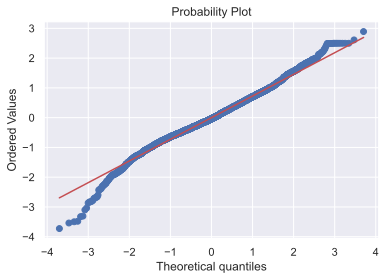


In your dataset you quite fat tails. You have 0.015 potential outliers (97 rows)


{'Satisfied': ['Autocorrelation'],
 'Potentially': ['Linearity', 'Autocorrelation', 'Sub-Normality'],
 'Violated': ['Multicollinearity', 'Normality']}

In [194]:
MyAssumption_Tester_OLS.run_all()

According to previous results, we are starting droping the columns density, pH and alcohol because Variance Inflation Factors (VIF)> 100. That means that there are multicollinearities among those variables.

### droping columns density, pH and alcohol

In [272]:
from Assumptions import Assumption_Tester_OLS as ast

In [273]:
y=df_reg.quality# our target
X=df_reg.drop(['density', 'pH','alcohol','quality'], axis=1)# our features

Fitting linear regression

R^2: 0.1451079082646337 

Coefficients
-------------------------------------
Intercept: 6.784753647784444
fixed_acidity: -0.06
volatile_acidity: -1.41
citric_acid: 0.31
residual_sugar: -0.0
chlorides: -4.79
free_sulfur_dioxide: 0.01
total_sulfur_dioxide: -0.0
sulphates: 0.79
white: -0.02

Assumption 1: Linear Relationship between the Target and the Features
Checking with a scatter plot of actual vs. predicted. Predictions should follow the diagonal line.


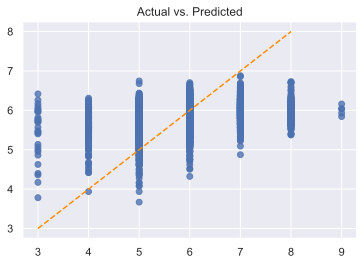

If non-linearity is apparent, consider adding a polynomial term 
		or using box-cox transformation to make X or y follow normal distribution



Building a correlation table


Parameters that are most likely VIOLATE linearity assumption and their correlation with quality


fixed_acidity          -0.076743
citric_acid             0.085532
residual_sugar         -0.036980
chlorides              -0.200666
free_sulfur_dioxide     0.055463
total_sulfur_dioxide   -0.041385
sulphates               0.038485
Name: quality, dtype: float64


Parameters that are most likely FOLLOW linearity assumption and their correlation with quality


volatile_acidity   -0.265699
Name: quality, dtype: float64


Assumption 2: Little to no multicollinearity among predictors


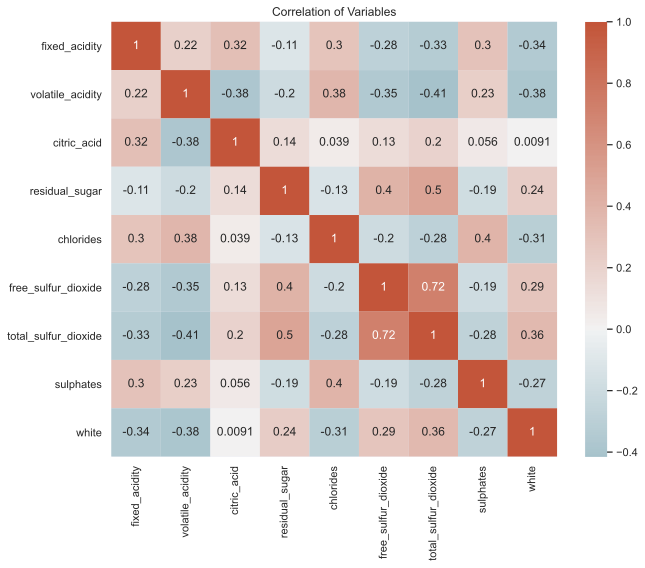

Variance Inflation Factors (VIF)
> 10: An indication that multicollinearity may be present
> 100: Certain multicollinearity among the variables
-------------------------------------
fixed_acidity: 29.03896896071285
sulphates: 15.636611311226323
total_sulfur_dioxide: 12.377776377708601
citric_acid: 9.074153153280028
free_sulfur_dioxide: 8.325263692212548
volatile_acidity: 8.124200351402106
chlorides: 4.945104151220566
residual_sugar: 3.1385497869756067
white: 2.4020997129550867

3 cases of possible multicollinearity
0 cases of definite multicollinearity

Assumption possibly satisfied

Coefficient interpretability may be problematic
Consider removing variables with a high Variance Inflation Factor (VIF)

Assumption 3: No Autocorrelation

Performing Durbin-Watson Test
Values of 1.5 < d < 2.5 generally show that there is no autocorrelation in the data
0 to 2< is positive autocorrelation
>2 to 4 is negative autocorrelation
-------------------------------------
Durbin-Watson: 1.6582071429661

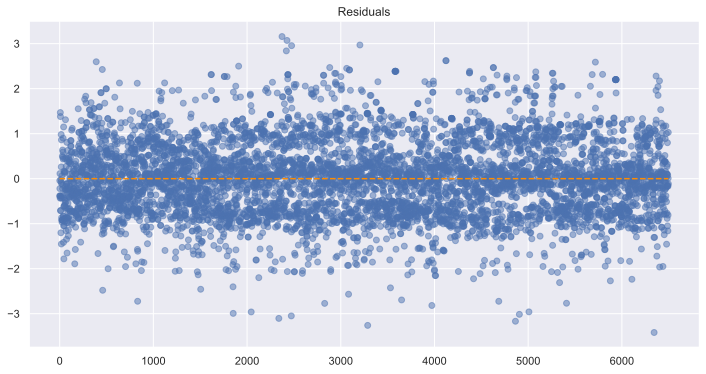

If heteroskedasticity is apparent, confidence intervals and predictions will be affected

Consider removing outliers and preprocessing features - nonlinear transformation can help


{'Lagrange Multiplier': 1808.4850473597498,
 'pvalue for LM': 0.0,
 'F stats': 278.066037867529,
 'pvalue for Fstats': 0.0}

Signs of positive autocorrelation 

Assumption potentially not satisfied 


Assumption 5: The error terms are kinda normally distributed

Using the Anderson-Darling test for normal distribution
p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


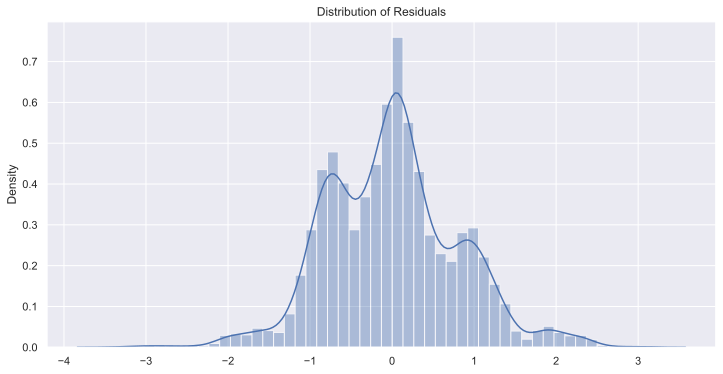


Assumption not satisfied

Confidence intervals will likely be affected
Try performing nonlinear transformations on variables
Building a probability plot


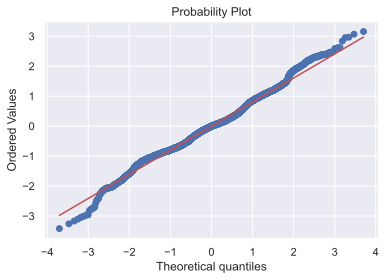


In fact outliers are super significant. Probably it is better to split your dataset into 2 different ones.


{'Satisfied': ['Autocorrelation'],
 'Potentially': ['Linearity', 'Multicollinearity', 'Autocorrelation'],
 'Violated': ['Normality', 'Sub-Normality']}

In [274]:
ast(X,y).run_all()

A good model of linear regression is :
    H1: variables follow a normal distribution
    H2: Esperance(errors)=0
    H3: Hoscedasticity, Var(errors)=0
    H4: No autocorrelation, cov(error(i), error(j))=0
    H5: Errors follow the "loi normale centrée"
    H6: Exogeneity, Cov(x(i),Error(i))=0, x(i) and error(i) are independants

First test: 
    
    1. fitting the linear correlation :
    R^2: 0.15
    If non-linearity is apparent, consider adding a polynomial term 
    or using box-cox transformation to make X or y follow normal distribution
    
    2. Building a correlation table:
    Parameters that are most likely VIOLATE linearity assumption and their correlation with quality
    fixed_acidity          -0.076743
    citric_acid             0.085532
    residual_sugar         -0.036980
    chlorides              -0.200666
    free_sulfur_dioxide     0.055463
    total_sulfur_dioxide   -0.041385
    sulphates               0.038485
    Name: quality, dtype: float64
    
    3. multicollinearity:
    6 cases of possible multicollinearity
    3 cases of definite multicollinearity
    Assumption satisfied
    
    4. no autocorrelations:
    Assumption satisfied
    
    5. Homoskedasticity of Error Terms
    Signs of positive autocorrelation 
    Assumption potentially not satisfied
    
    6. The error terms are kinda normally distributed
    You have 0.015 potential outliers (97 rows)
    Assumption not satisfied


2nd test :
    1. Fitting linear regression
    R^2: 0.145107908264633

    2. Building a correlation table:
        Parameters that are most likely VIOLATE linearity assumption and their correlation with quality
        fixed_acidity          -0.076743
        citric_acid             0.085532
        residual_sugar         -0.036980
        chlorides              -0.200666
        free_sulfur_dioxide     0.055463
        total_sulfur_dioxide   -0.041385
        sulphates               0.038485
        
    3. Variance Inflation Factors (VIF)
        > 10: An indication that multicollinearity may be present
        > 100: Certain multicollinearity among the variables
        -------------------------------------
        fixed_acidity: 29.03896896071285


        3 cases of possible multicollinearity
        0 cases of definite multicollinearity
        Assumption possibly satisfied
        
    4.no autocorrelations:
        Assumption satisfied
        
    5. Homoskedasticity of Error Terms
        Assumption not satisfied
        
    6. The error terms are kinda normally distributed
    In fact outliers are super significant. Probably it is better to split your dataset into 2 different ones.

# Test 3: without fixed_acidity

In [279]:
from Assumptions import Assumption_Tester_OLS as ast

In [280]:
y=df_reg.quality# our target
X=df_reg.drop(['density', 'pH','alcohol','quality','fixed_acidity'], axis=1)# our features

Fitting linear regression

R^2: 0.14083144462820785 

Coefficients
-------------------------------------
Intercept: 6.46669836014641
volatile_acidity: -1.49
citric_acid: 0.1
residual_sugar: -0.0
chlorides: -4.92
free_sulfur_dioxide: 0.01
total_sulfur_dioxide: -0.0
sulphates: 0.74
white: -0.0

Assumption 1: Linear Relationship between the Target and the Features
Checking with a scatter plot of actual vs. predicted. Predictions should follow the diagonal line.


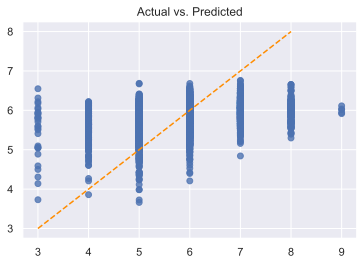

If non-linearity is apparent, consider adding a polynomial term 
		or using box-cox transformation to make X or y follow normal distribution



Building a correlation table


Parameters that are most likely VIOLATE linearity assumption and their correlation with quality


citric_acid             0.085532
residual_sugar         -0.036980
chlorides              -0.200666
free_sulfur_dioxide     0.055463
total_sulfur_dioxide   -0.041385
sulphates               0.038485
Name: quality, dtype: float64


Parameters that are most likely FOLLOW linearity assumption and their correlation with quality


volatile_acidity   -0.265699
Name: quality, dtype: float64


Assumption 2: Little to no multicollinearity among predictors


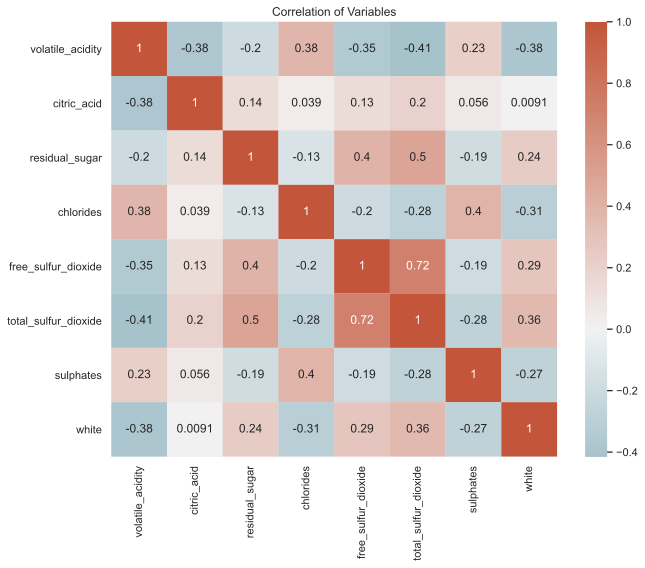

Variance Inflation Factors (VIF)
> 10: An indication that multicollinearity may be present
> 100: Certain multicollinearity among the variables
-------------------------------------
total_sulfur_dioxide: 12.3370023746019
sulphates: 12.089369508139963
free_sulfur_dioxide: 8.323329060750352
citric_acid: 6.0904382100036205
volatile_acidity: 5.859722042547988
chlorides: 4.93947294600138
residual_sugar: 3.1323605701161723
white: 2.3725176479123635

2 cases of possible multicollinearity
0 cases of definite multicollinearity

Assumption possibly satisfied

Coefficient interpretability may be problematic
Consider removing variables with a high Variance Inflation Factor (VIF)

Assumption 3: No Autocorrelation

Performing Durbin-Watson Test
Values of 1.5 < d < 2.5 generally show that there is no autocorrelation in the data
0 to 2< is positive autocorrelation
>2 to 4 is negative autocorrelation
-------------------------------------
Durbin-Watson: 1.6627321723952888
Little to no autocorrelation 



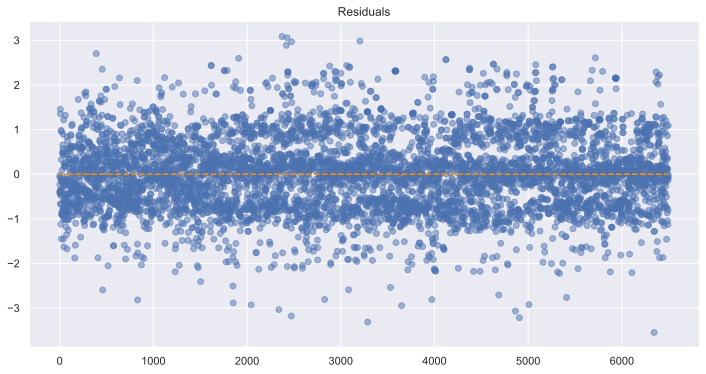

If heteroskedasticity is apparent, confidence intervals and predictions will be affected

Consider removing outliers and preprocessing features - nonlinear transformation can help


{'Lagrange Multiplier': 1772.06118229249,
 'pvalue for LM': 0.0,
 'F stats': 304.2077753684839,
 'pvalue for Fstats': 0.0}

Signs of positive autocorrelation 

Assumption potentially not satisfied 


Assumption 5: The error terms are kinda normally distributed

Using the Anderson-Darling test for normal distribution
p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


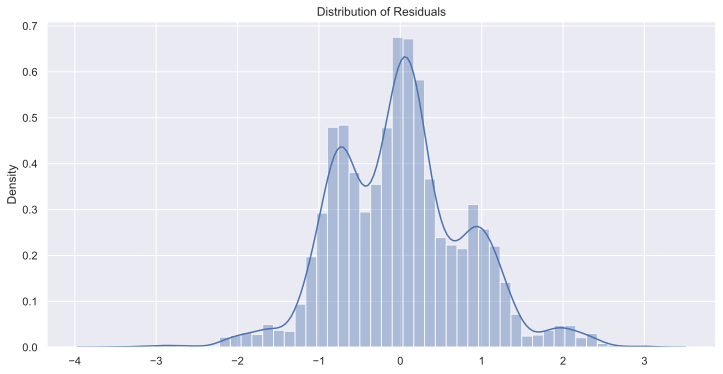


Assumption not satisfied

Confidence intervals will likely be affected
Try performing nonlinear transformations on variables
Building a probability plot


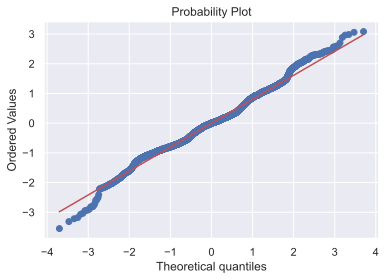


In fact outliers are super significant. Probably it is better to split your dataset into 2 different ones.


{'Satisfied': ['Autocorrelation'],
 'Potentially': ['Linearity', 'Multicollinearity', 'Autocorrelation'],
 'Violated': ['Normality', 'Sub-Normality']}

In [282]:
ast(X,y).run_all()

In [294]:
y.unique()

array([5., 6., 7., 4., 8., 3., 9.])

# test 4: polynomial function apply to X

In [286]:
y=df_reg.quality# our target
X=df_reg.drop(['density', 'pH','alcohol','quality','fixed_acidity'], axis=1)# our features

In [291]:
# Fitting Polynomial Regression to the dataset 
from sklearn.preprocessing import PolynomialFeatures 
  
poly = PolynomialFeatures(degree = 4) 
X_poly = poly.fit_transform(X)

# test5: boxcox apply to X

In [314]:
from sklearn.ensemble import RandomForestRegressor

In [315]:
lr=RandomForestRegressor()
lr.fit(X,y)

RandomForestRegressor()

In [311]:
lr.predict(X)

array([5., 5., 5., ..., 6., 7., 6.])

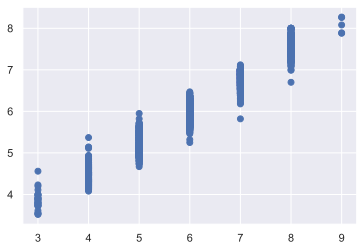

In [316]:
plt.scatter(y,lr.predict(X))

In [317]:
from sklearn.metrics import r2_score

In [318]:
r2_score(y,lr.predict(X))

0.9276317227956318

In [313]:
confusion_matrix(y,lr.predict(X))

array([[  30,    0,    0,    0,    0,    0,    0],
       [   0,  216,    0,    0,    0,    0,    0],
       [   0,    0, 2138,    0,    0,    0,    0],
       [   0,    0,    0, 2836,    0,    0,    0],
       [   0,    0,    0,    0, 1079,    0,    0],
       [   0,    0,    0,    0,    0,  193,    0],
       [   0,    0,    0,    0,    0,    0,    5]])